In [ ]:
import pandas as pd                    # Reads the (I/O) file (eg- csv file)
pd.options.mode.chained_assignment = None   # Doesn't raise exceptions

In [ ]:
from datetime import datetime        # date time library
import seaborn as sns                # data visualization library
import matplotlib.pyplot as plt      # data visualization library
%matplotlib inline

In [ ]:
data = pd.read_csv('news_syn.csv')         # reads csv data from csv input file

In [ ]:
data.head()                                # reads first five rows from dataframe

,Article category,News Headline,Author,news_link,short_description,date
0,WEDDINGS,Real Weddings: Couples Who Got Married This We...,NaN,_RARE_,If there's ever a time you need a little distr...,29/07/13
1,WELLNESS,The Moment I Knew,"MeiMei Fox, Contributor\nNYTimes bestselling a...",_RARE_,NaN,02/05/13
2,POLITICS,Sunday Roundup,"Arianna Huffington, Contributor",_RARE_,NaN,17/01/15
3,PARENTS,Funniest Parenting Tweets: What Moms And Dads ...,Hollis Miller,_RARE_,"Kids may say the darndest things, but parents ...",15/07/16
4,BUSINESS,WATCH: 60 Seconds of Social Media,"Shawn Amos, Contributor\nblues preacher | cont...",_RARE_,"So, you think you're a real fashionista, hmm? ...",18/08/12


In [ ]:
data.info()                          # gives information about the dataset's features with its non null values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Article category   10000 non-null  object
 1   News Headline      9087 non-null   object
 2   Author             7282 non-null   object
 3   news_link          10000 non-null  object
 4   short_description  3874 non-null   object
 5   date               10000 non-null  object
dtypes: object(6)
memory usage: 468.9+ KB


### Finding Percentage of Missing values

In [ ]:
#pip install missingno

In [ ]:
import missingno as msno

<Axes: >

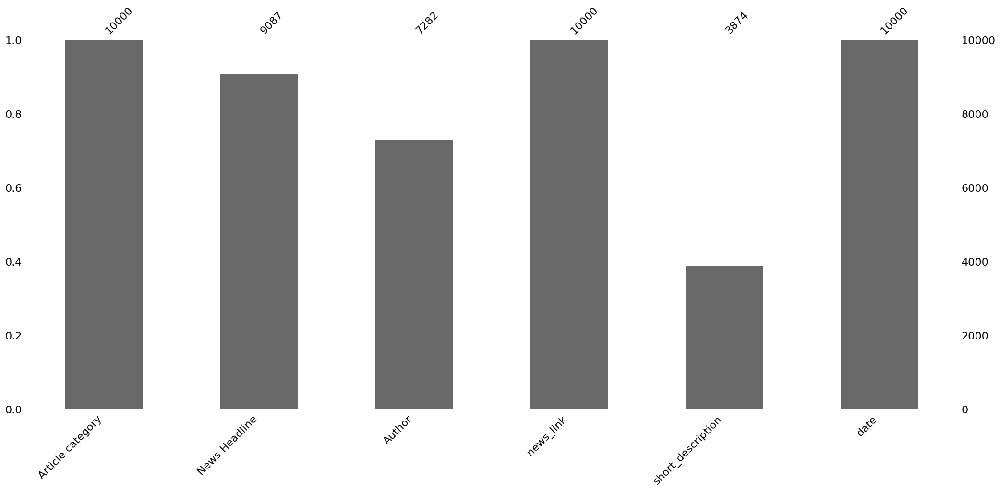

In [ ]:
msno.bar(data)

### Percentage of missing values

In [ ]:
data.isnull().mean()*100

Article category      0.00
News Headline         9.13
Author               27.18
news_link             0.00
short_description    61.26
date                  0.00
dtype: float64

* News Headline has missing percentage less than 10%. The corresponding rows can be removed from the dataset.

### Plotting number of articles in each category

Text(0.5, 0.98, 'Number of articles( for each category)')

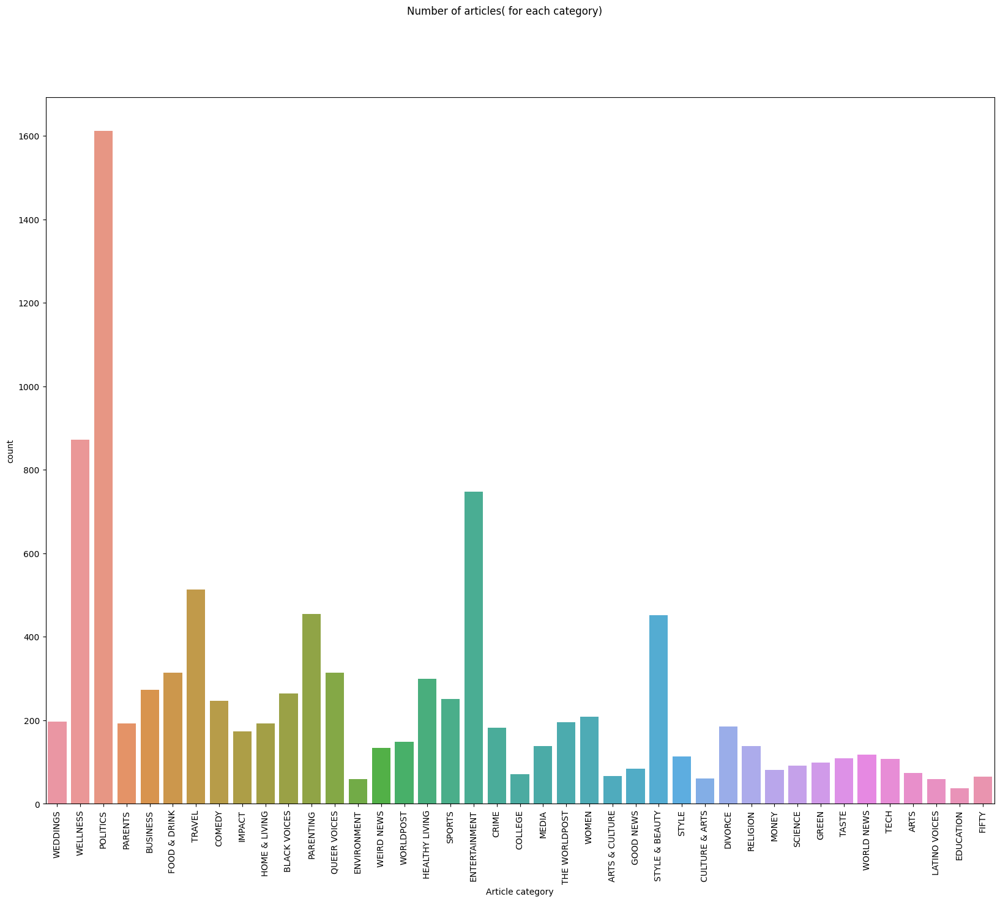

In [ ]:
fig=plt.figure(figsize=(20,15))
sns.countplot(x = data['Article category'])
plt.xticks(rotation=90)
fig.suptitle('Number of articles( for each category)')

* Politics and Wellness seem to have most number of articles.

* Education has the lowest number of articles.

### Number of Articles in each year

In [ ]:
data['date'] = pd.to_datetime(data['date'])         # Convering datatype to date.

   year  number_of articles
0  2015                2595
1  2014                2496
2  2013                1958
3  2012                1578
4  2016                 836
5  2017                 316
6  2018                 221


<Axes: xlabel='year', ylabel='number_of articles'>

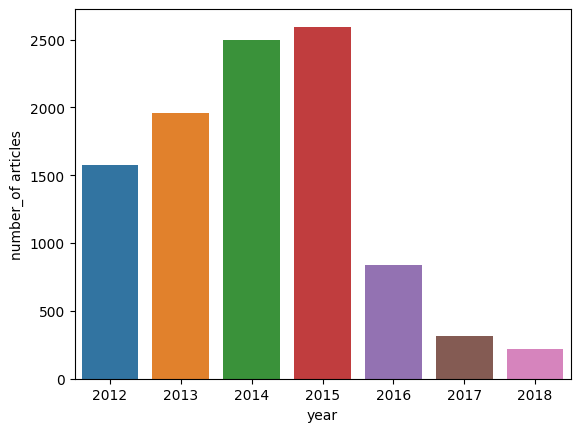

In [ ]:
year = data.date.apply(lambda x: datetime.date(x).year)
articles_per_year = year.value_counts().reset_index()
articles_per_year.columns = ['year','number_of articles']
print(articles_per_year)
sns.barplot(x = articles_per_year.year, y =articles_per_year['number_of articles'],data=articles_per_year)

* Year (2014 and 2015 had most articles) while 2018 had the least articles

### Total number of Articles in each month

In [ ]:
auth1 = data['Author'].mode()
auth1[0]

'Arianna Huffington, Contributor'

In [ ]:
data['Author'].fillna(value = auth1[0], axis = 0, inplace = True)
data['Author']

0                         Arianna Huffington, Contributor
1       MeiMei Fox, Contributor\nNYTimes bestselling a...
2                         Arianna Huffington, Contributor
3                                           Hollis Miller
4       Shawn Amos, Contributor\nblues preacher | cont...
                              ...                        
9995                      Arianna Huffington, Contributor
9996                                         Emma Mustich
9997                      Arianna Huffington, Contributor
9998                      Arianna Huffington, Contributor
9999                      Arianna Huffington, Contributor
Name: Author, Length: 10000, dtype: object

    month_num  number_of articles
0           6                1287
1           5                1141
2           7                 957
3           4                 872
4           1                 865
5           3                 777
6          10                 764
7          12                 736
8           8                 707
9          11                 686
10          9                 618
11          2                 590


<Axes: xlabel='month_num', ylabel='number_of articles'>

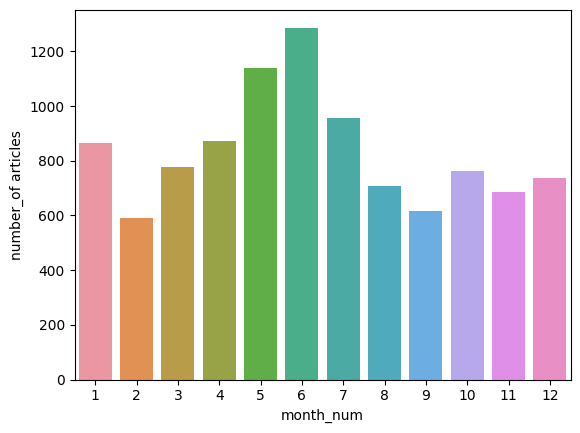

In [ ]:
month= data.date.apply(lambda x: datetime.date(x).month)
articles_per_month=month.value_counts().reset_index()
articles_per_month.columns=['month_num','number_of articles']
print(articles_per_month)
sns.barplot(x = articles_per_month['month_num'], y = articles_per_month['number_of articles'],data=articles_per_month)


* For all these years , (6th and 5th) month had the highest articles.

* Month(2nd and 9th) had the lowest articles.

In [ ]:
def rem_author(text):

    '''The input is in the form of text. The function removes the text followed by the ',' especially the column Author .
       The output is name of the author with ',' and name of the author without any ambiguity.'''
    result = ''
    for i in range(len(text)):
        if(text[i] == ','):
            break
        else:
            result = result + text[i]

    return result

In [ ]:
data['Author'] = data['Author'].apply(lambda text: rem_author(text))
data['Author']

0       Arianna Huffington
1               MeiMei Fox
2       Arianna Huffington
3            Hollis Miller
4               Shawn Amos
               ...        
9995    Arianna Huffington
9996          Emma Mustich
9997    Arianna Huffington
9998    Arianna Huffington
9999    Arianna Huffington
Name: Author, Length: 10000, dtype: object

### Size of the dataset

In [ ]:
data.shape

(10000, 6)

In [ ]:
data['News Headline'].isnull().sum()

913

In [ ]:
df = data.copy()   # making a copy of the dataset 'data'

In [ ]:
df.isnull().mean()*100

Article category      0.00
News Headline         9.13
Author                0.00
news_link             0.00
short_description    61.26
date                  0.00
dtype: float64

In [ ]:
df.dropna(subset = ['News Headline'], inplace = True)

In [ ]:
df.reset_index(inplace = True)

In [ ]:
df.drop(columns = ['news_link', 'date', 'short_description','index'], inplace = True)

In [ ]:
df.isnull().mean()*100

Article category    0.0
News Headline       0.0
Author              0.0
dtype: float64

### Lowering Case

* From the first glance we just lower case the data. The idea is to convert the input text into the same casing format so that it converts ‘DATA’, ’Data’, ‘DaTa’, ‘DATa’ into ‘data’ and all will be treated in same way.

In [ ]:

df["News Headline"] = df["News Headline"].str.lower()
df['Author'] = df["Author"].str.lower()


In [ ]:
df.head()

,Article category,News Headline,Author
0,WEDDINGS,real weddings: couples who got married this we...,arianna huffington
1,WELLNESS,the moment i knew,meimei fox
2,POLITICS,sunday roundup,arianna huffington
3,PARENTS,funniest parenting tweets: what moms and dads ...,hollis miller
4,BUSINESS,watch: 60 seconds of social media,shawn amos


### Removal of Emails

* While working with Twitter or Instagram data, we often encounter the email id in the text. If we don’t remove the email id from the text first and remove the punctuations, it will create the problem as only @ will be removed, not the whole email id.

In [ ]:
def remove_mail(text):

    ''' The input value for the function is text. It searches the 'email' in the provided text and removes it.
        Output is also text, with 'email' removed from the text. '''

    text = ' '.join([i for i in text.split() if '@' not in i])
    return text

In [ ]:
df['News Headline'] = df['News Headline'].apply(lambda text: remove_mail(text))
df['Author'] = df['Author'].apply(lambda text: remove_mail(text))


In [ ]:
df.head()

,Article category,News Headline,Author
0,WEDDINGS,real weddings: couples who got married this we...,arianna huffington
1,WELLNESS,the moment i knew,meimei fox
2,POLITICS,sunday roundup,arianna huffington
3,PARENTS,funniest parenting tweets: what moms and dads ...,hollis miller
4,BUSINESS,watch: 60 seconds of social media,shawn amos


### Removal of URLS

* When we collect the data manually from the website, Wikipedia pages, or some blogs, there are often URL links in them. Sometimes they are important, but what if we don’t need them, there is an easy solution to it.

In [ ]:
def remove_urls(text):

    ''' The input value for the function is text. It searches the 'url' in the provided text and removes it.
        Output is also text, with 'url' removed from the text. '''

    text = ' '.join([i for i in text.split() if 'https://' not in i])
    text = ' '.join([i for i in text.split() if '.com' not in i])
    return text

In [ ]:
df['News Headline'] = df['News Headline'].apply(lambda text: remove_urls(text))
df['Author'] = df['Author'].apply(lambda text: remove_urls(text))

### Removal of HTML Tags

* When we collect the data manually from the website, Wikipedia pages, or some blogs, there are often URL links in them. Sometimes they are important, but what if we don’t need them,  there is an easy solution to it.

In [ ]:
import re

In [ ]:
def remove_html(text):

    ''' The input value for the function is text. It searches the 'html tag' in the provided text and removes it.
        Output is also text, with 'html tag' removed from the text. '''

    html_pattern = re.compile('<.*?>')
    return html_pattern.sub(r'', text)

In [ ]:
df['News Headline'] = df['News Headline'].apply(lambda text: remove_html(text))
df['Author'] = df['Author'].apply(lambda text: remove_html(text))


In [ ]:
df.head()

,Article category,News Headline,Author
0,WEDDINGS,real weddings: couples who got married this we...,arianna huffington
1,WELLNESS,the moment i knew,meimei fox
2,POLITICS,sunday roundup,arianna huffington
3,PARENTS,funniest parenting tweets: what moms and dads ...,hollis miller
4,BUSINESS,watch: 60 seconds of social media,shawn amos


### Contractions


* There are so many contractions in the text we type so to expand them we will use the contractions library.



In [ ]:

pip install contractions

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 103.2/103.2 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 289.9/289.9 kB 25.4 MB/s eta 0:00:00


In [ ]:
import contractions

In [ ]:
def rem_contract(text):
    ''' The input value for the function is text. The function expands the contractions in the text.
        The output is also text with contracted words being expanded'''
    text = contractions.fix(text)
    return text

In [ ]:
df['News Headline'] = df['News Headline'].apply(lambda text: rem_contract(text))
df['Author'] = df['Author'].apply(lambda text: rem_contract(text))

In [ ]:
df.head()

,Article category,News Headline,Author
0,WEDDINGS,real weddings: couples who got married this we...,arianna huffington
1,WELLNESS,the moment i knew,meimei fox
2,POLITICS,sunday roundup,arianna huffington
3,PARENTS,funniest parenting tweets: what moms and dads ...,hollis miller
4,BUSINESS,watch: 60 seconds of social media,shawn amos


### Removal of Punctuations & Numbers

* One another common text preprocessing technique is to remove the punctuations from the text data. This is again a text standardization process that will help to treat 'hurray' and 'hurray!' in the same way.

In [ ]:
import string
import re

In [ ]:
remove_punct = list(string.punctuation)
punc = ['―', '“', '”']
rem_punctuation = remove_punct + punc
remove = set(rem_punctuation)

def rem_punctuation(text):

    '''The input is in the form of text. The function removes the punctuations and numbers from the text.
       The output is again text with punctuations and numbers removed from the sentence.'''
    text  = ''.join([char  for char in text  if char not in remove]) # join items using space character
    text = re.sub('[0-9]+', '', text)                                       # returns a string with replaced values.
    return text

In [ ]:
df['News Headline'] = df['News Headline'].apply(lambda x : rem_punctuation(x))
df['Author'] = df['Author'].apply(lambda x : rem_punctuation(x))

In [ ]:
df.head()

,Article category,News Headline,Author
0,WEDDINGS,real weddings couples who got married this wee...,arianna huffington
1,WELLNESS,the moment i knew,meimei fox
2,POLITICS,sunday roundup,arianna huffington
3,PARENTS,funniest parenting tweets what moms and dads s...,hollis miller
4,BUSINESS,watch seconds of social media,shawn amos


### Removal of stopwords

* Stopwords are commonly occuring words in a language like 'the', 'a' and so on. They can be removed from the text most of the times, as they don't provide valuable information for downstream analysis.

In [ ]:
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
stop1 = stopwords.words('english')
stop2 = ['yikes', 'ouch', 'wow', 'whoops', 'bow', 'awww', 'oops', 'pr', 'hmm', 'hello', 'welcome']
stop = stop1 + stop2

def remove_stopwords(text):

    '''The input is in form of text. It removes the stopwords from the text which do not add any meaning to the sentence.
       The output is also in the form of text with stopwords being removed from the sentence.'''
    text = ' '.join([word for word in text.split() if word not in stop])
    return text


In [ ]:

df['News Headline'] = df['News Headline'].apply(lambda text: remove_stopwords(text))
df['Author'] = df['Author'].apply(lambda text: remove_stopwords(text))


In [ ]:
df.head()

,Article category,News Headline,Author
0,WEDDINGS,real weddings couples got married weekend,arianna huffington
1,WELLNESS,moment knew,meimei fox
2,POLITICS,sunday roundup,arianna huffington
3,PARENTS,funniest parenting tweets moms dads said twitt...,hollis miller
4,BUSINESS,watch seconds social media,shawn amos


### Removal of Emojis

* Growing users of the audience on the social media platforms, well there is a significant explosion of usage of emojis in day-to-day life. Well, when we are performing text analysis in some cases removal of emojis is the correct way as sometimes they don’t hold any information.

In [ ]:
def remove_emoji(string):

    '''The input is in the form of text. The function removes emojis from the given input text.
       The output is in the form of text with all the emojis being removed from it. '''
    emoji_pattern = re.compile("["
                           u"\U0001F600-\U0001F64F"  # emoticons
                           u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                           u"\U0001F680-\U0001F6FF"  # transport & map symbols
                           u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           u"\U00002702-\U000027B0"
                           u"\U000024C2-\U0001F251"
                           "]+", flags=re.UNICODE)
    return emoji_pattern.sub(r'', string)


In [ ]:
df['News Headline'] = df['News Headline'].apply(lambda x : remove_emoji(x))
df['Author'] = df['Author'].apply(lambda x : remove_emoji(x))


In [ ]:
df.value_counts('News Headline')

News Headline
sunday roundup                                                           2075
moment knew                                                              1015
best parenting tweets moms dads said twitter week                         514
weekly roundup ebay vintage clothing finds                                455
watch top youtube videos week                                             387
watch hulu new week                                                       372
weeks top news stories africa                                             361
days inspiration new year                                                 343
week pictures faith practice around world                                 280
real weddings couples got married weekend photos                          272
weekly roundup ebay vintage clothing finds photos                         257
best late night clips week videophotos                                    254
watch amazon prime new week                       

### Tokenization

In [ ]:
from nltk import tokenize
nltk.download('punkt')
def tokenize_word(text):

    '''The input is in the form text. The function converts the text into token of words.
       The output is in the form of token of words.'''
    words = tokenize.word_tokenize(text)
    return words

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [ ]:
df['News Headline'] = df['News Headline'].apply(lambda x : tokenize_word(x))
df['Author'] = df['Author'].apply(lambda x : tokenize_word(x))


In [ ]:
df.head()

,Article category,News Headline,Author
0,WEDDINGS,"[real, weddings, couples, got, married, weekend]","[arianna, huffington]"
1,WELLNESS,"[moment, knew]","[meimei, fox]"
2,POLITICS,"[sunday, roundup]","[arianna, huffington]"
3,PARENTS,"[funniest, parenting, tweets, moms, dads, said...","[hollis, miller]"
4,BUSINESS,"[watch, seconds, social, media]","[shawn, amos]"


### Lemmatization
* Lemmatization usually refers to doing things properly with the use of a vocabulary and morphological analysis of words, normally aiming to remove inflectional endings only and to return the base or dictionary form of a word, which is known as the Lemmatization.


In [ ]:
from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')
nltk.download('omw-1.4')
def lemmatize(text):

    '''The input is token of words. It converts the word to its root word.
       The output is token of root words.'''
    wnl = WordNetLemmatizer()
    stem_words=[]
    for word in text:
        root_word= wnl.lemmatize(word)
        root_word1= wnl.lemmatize(root_word, pos = 'v')
        root_word2= wnl.lemmatize(root_word1, pos = 'a')
        root_word3= wnl.lemmatize(root_word2, pos = 'r')
        stem_words.append(root_word3)
    return stem_words

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


In [ ]:
df['News Headline'] = df['News Headline'].apply(lambda x : lemmatize(x))
df['Author'] = df['Author'].apply(lambda x : lemmatize(x))

In [ ]:
df.head()

,Article category,News Headline,Author
0,WEDDINGS,"[real, wed, couple, get, marry, weekend]","[arianna, huffington]"
1,WELLNESS,"[moment, know]","[meimei, fox]"
2,POLITICS,"[sunday, roundup]","[arianna, huffington]"
3,PARENTS,"[funny, parent, tweet, mom, dad, say, twitter,...","[hollis, miller]"
4,BUSINESS,"[watch, second, social, medium]","[shawn, amos]"


In [ ]:
import sklearn
from sklearn.feature_extraction.text import CountVectorizer
from wordcloud import WordCloud
from textwrap import wrap
from textblob import TextBlob

### Generate document term matrix to find most occuring terms.


* A Document Term Matrix provides the frequency of a word in a corpus (collection of documents).
* It helps in analyzing the occurrence of words in different documents in a corpus.

In [ ]:
val = []
for token in df['News Headline']:
    val.append((' '.join(token)))
head_val = pd.DataFrame(val, columns = ['News Headline'])
head_val

,News Headline
0,real wed couple get marry weekend
1,moment know
2,sunday roundup
3,funny parent tweet mom dad say twitter week
4,watch second social medium
...,...
9082,real wed couple get marry weekend photo
9083,parenthesis best mom dad blog week
9084,sunday roundup
9085,watch top youtube video week


In [ ]:
df.reset_index(inplace = True)

In [ ]:
val1 = []
for token1 in df['Author']:
    val1.append((' '.join(token1)))
auth_val = pd.DataFrame(val1, columns = ['Author'])
auth_val

,Author
0,arianna huffington
1,meimei fox
2,arianna huffington
3,hollis miller
4,shawn amos
...,...
9082,arianna huffington
9083,emma mustich
9084,arianna huffington
9085,arianna huffington


In [ ]:
df1 = pd.concat([df['Article category'], head_val, auth_val], axis=1)
df1

,Article category,News Headline,Author
0,WEDDINGS,real wed couple get marry weekend,arianna huffington
1,WELLNESS,moment know,meimei fox
2,POLITICS,sunday roundup,arianna huffington
3,PARENTS,funny parent tweet mom dad say twitter week,hollis miller
4,BUSINESS,watch second social medium,shawn amos
...,...,...,...
9082,ENTERTAINMENT,real wed couple get marry weekend photo,arianna huffington
9083,FOOD & DRINK,parenthesis best mom dad blog week,emma mustich
9084,THE WORLDPOST,sunday roundup,arianna huffington
9085,TECH,watch top youtube video week,arianna huffington


In [ ]:
df1.isnull().sum()

Article category    0
News Headline       0
Author              0
dtype: int64

### Exploratory Data Analysis -  Data Exploration

* Now its time to explore the preprocessed and cleaned text reviews. Textual data can be explored using Word Clouds. These are visual representations of the frequency of different words present in text. Importance of words are represented by size of the word. Bigger size represents more frequently occuring words.

* Using the document term matrix created earlier with word clouds for plotting these words. Word clouds are the visual representations of the frequency of different words present in a document. It gives importance to the more frequent words which are bigger in size compared to other less frequent words.

### Word Cloud

In [ ]:
df2 = df1[['Article category','News Headline']].groupby(by='Article category').agg(lambda x:' '.join(x))
df2.head()

,News Headline
Article category,
ARTS,weekly roundup ebay vintage home find weekly r...
ARTS & CULTURE,weekly roundup ebay vintage clothe find weekly...
BLACK VOICES,week top news story africa week top news story...
BUSINESS,watch second social medium fashionably late st...
COLLEGE,week picture faith practice around world week ...


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

In [ ]:
cv2 = CountVectorizer(analyzer='word')
data = cv2.fit_transform(df2['News Headline'])
text_dtm = pd.DataFrame(data.toarray(), columns=cv2.vocabulary_.keys())
text_dtm.index=df2.index
text_dtm.head()

,weekly,roundup,ebay,vintage,home,find,photo,clothe,sunday,watch,...,dad,say,twitter,moment,know,parenthesis,blog,woman,might,miss
Article category,,,,,,,,,,,,,,,,,,,,,
ARTS,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,2,0,0,0,0
ARTS & CULTURE,1,1,3,0,0,0,0,0,0,42,...,8,0,0,9,0,42,0,0,0,3
BLACK VOICES,223,0,0,7,0,0,0,0,0,5,...,13,4,0,244,0,5,0,0,0,10
BUSINESS,1,0,0,14,13,3,0,0,0,0,...,123,21,2,135,2,13,0,13,3,85
COLLEGE,0,0,0,0,31,0,0,0,0,0,...,0,0,0,31,0,0,0,31,2,0


In [ ]:
df3 = df1[['Article category','Author']].groupby(by='Article category').agg(lambda x:' '.join(x))
df3.head()

,Author
Article category,
ARTS,mary kincaid mary kincaid
ARTS & CULTURE,katherine brook priscilla frank priscilla fran...
BLACK VOICES,arianna huffington arianna huffington arianna ...
BUSINESS,shawn amos arianna huffington arianna huffingt...
COLLEGE,carol kuruvilla carol kuruvilla carolina moren...


In [ ]:
cv1 = CountVectorizer(analyzer='word')
data1 = cv1.fit_transform(df3['Author'])
text_dtm1 = pd.DataFrame(data1.toarray(), columns=cv1.vocabulary_.keys())
text_dtm1.index=df3.index
text_dtm1.head()

,mary,kincaid,katherine,brook,priscilla,frank,arianna,huffington,jenna,amatulli,...,denise,oliveira,liftopia,robin,wilkey,gerken,speigel,ruizgrossman,moye,duberman
Article category,,,,,,,,,,,,,,,,,,,,,
ARTS,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ARTS & CULTURE,0,0,0,0,0,5,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
BLACK VOICES,0,0,0,0,0,0,0,0,3,0,...,0,0,0,0,0,0,0,0,0,0
BUSINESS,0,0,0,0,0,0,0,1,38,0,...,1,0,0,0,0,0,0,0,0,0
COLLEGE,0,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### Word Cloud

* **Article Category vs News Headline**

In [ ]:
def wordcloud(data,title):
    wc = WordCloud(width=600, height=530, max_words=150,colormap="Dark2").generate_from_frequencies(data)
    plt.figure(figsize=(10,8))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
    plt.title('\n'.join(wrap(title,60)),fontsize=13)
    plt.show()


In [ ]:
text_dtm=text_dtm.transpose()

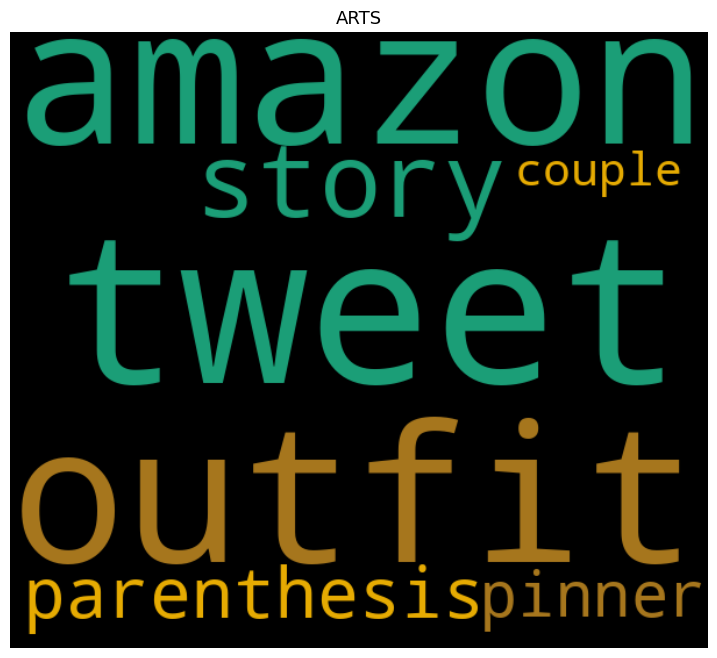

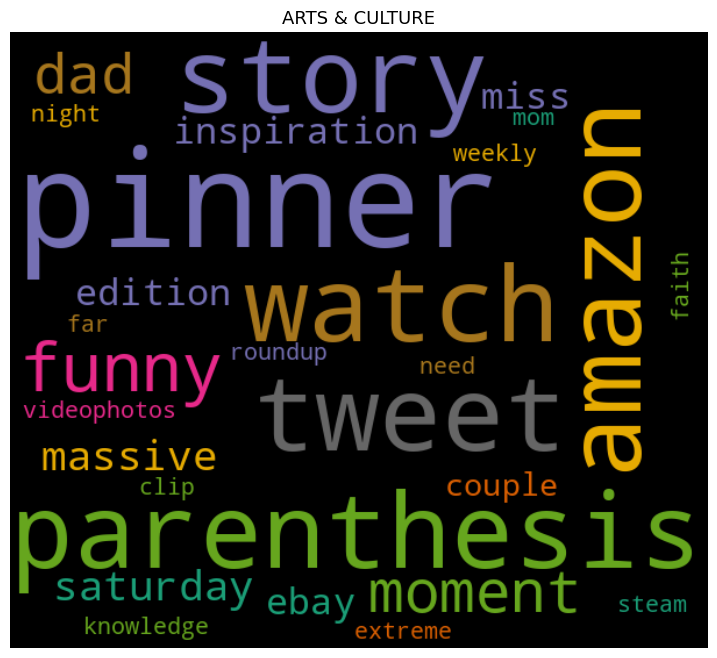

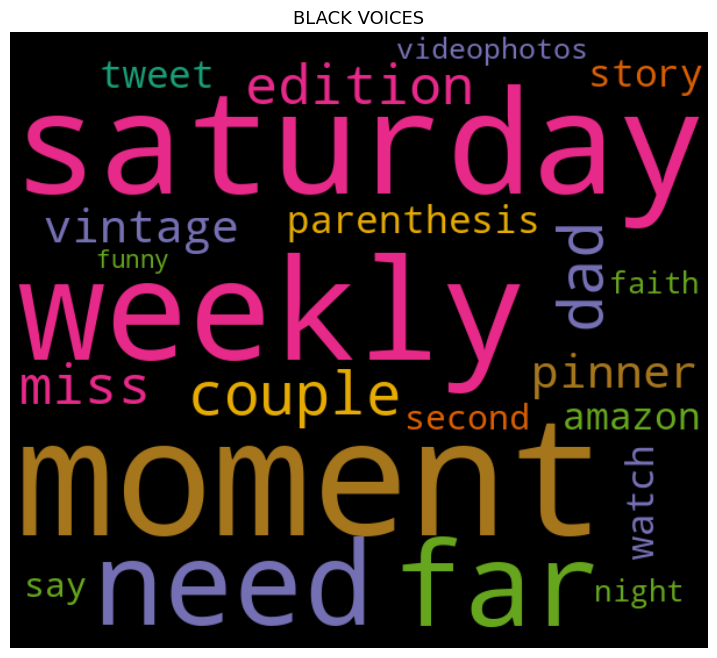

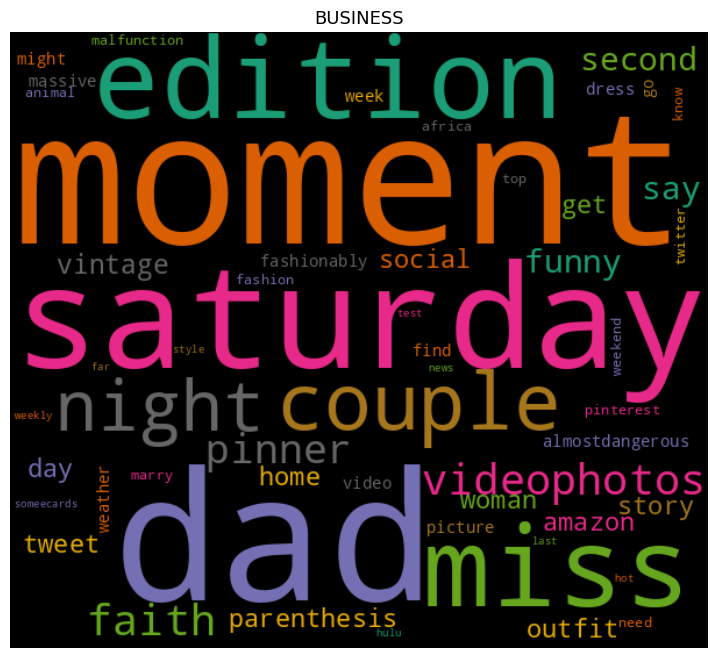

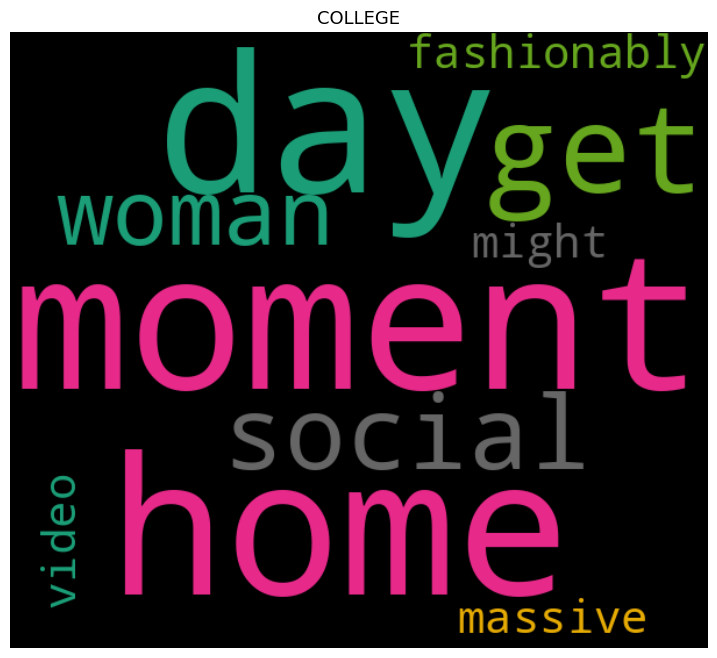

...

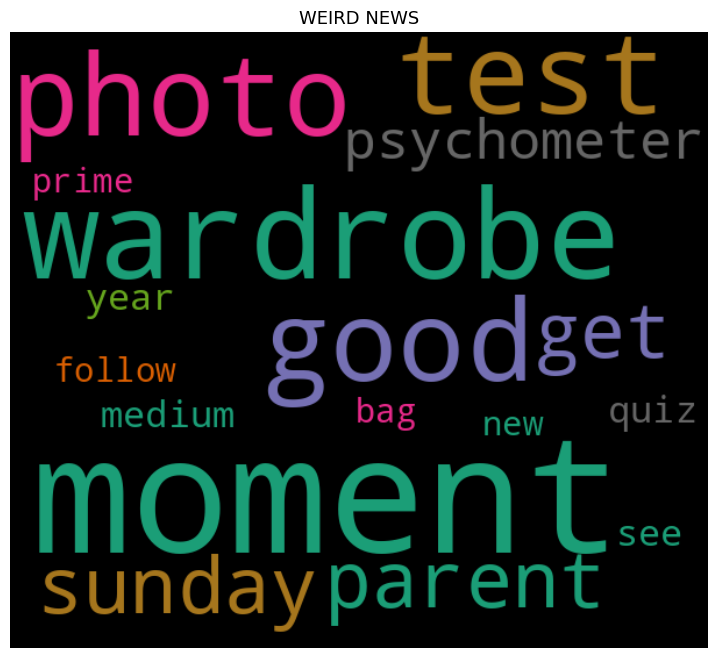

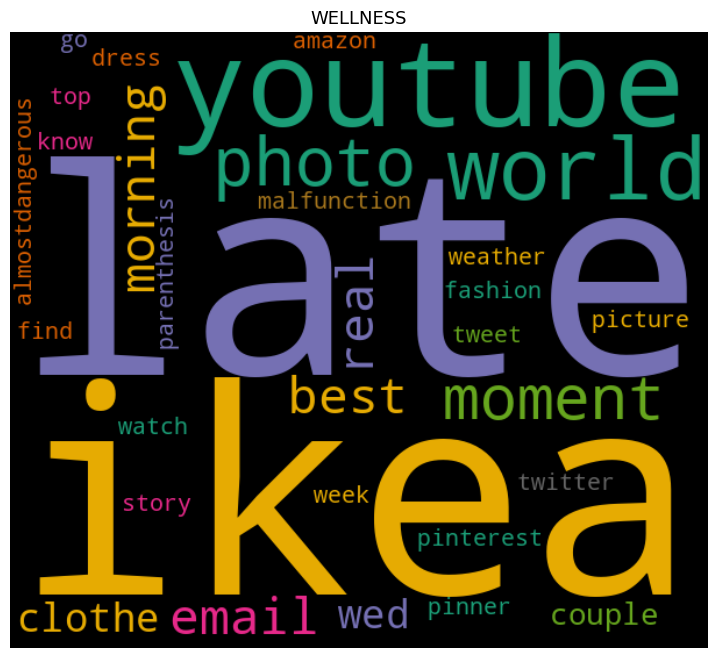

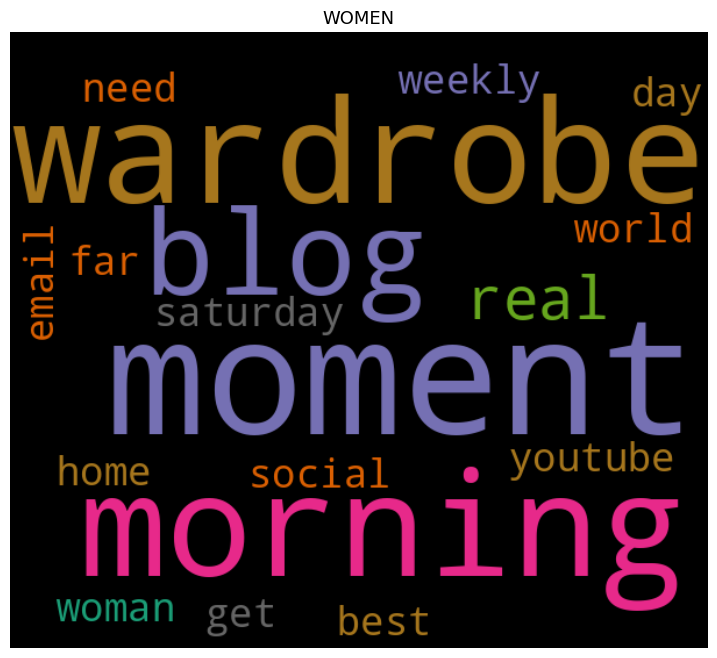

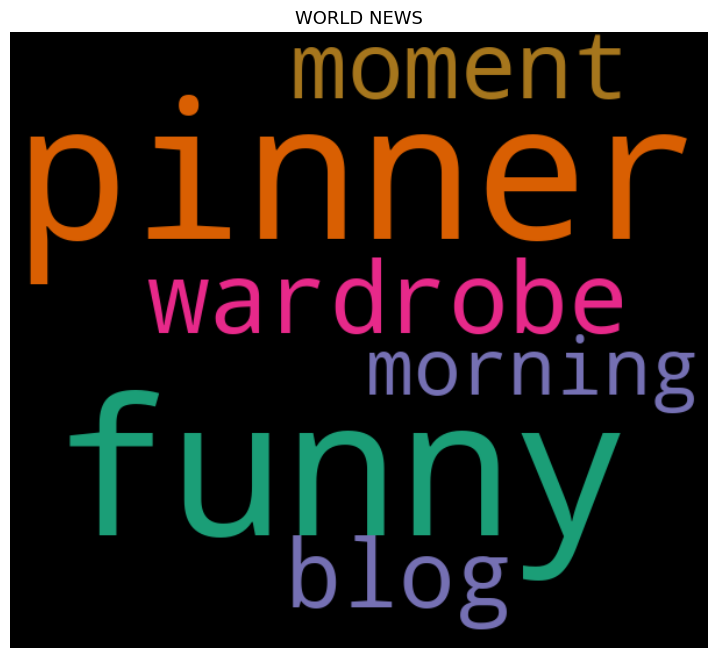

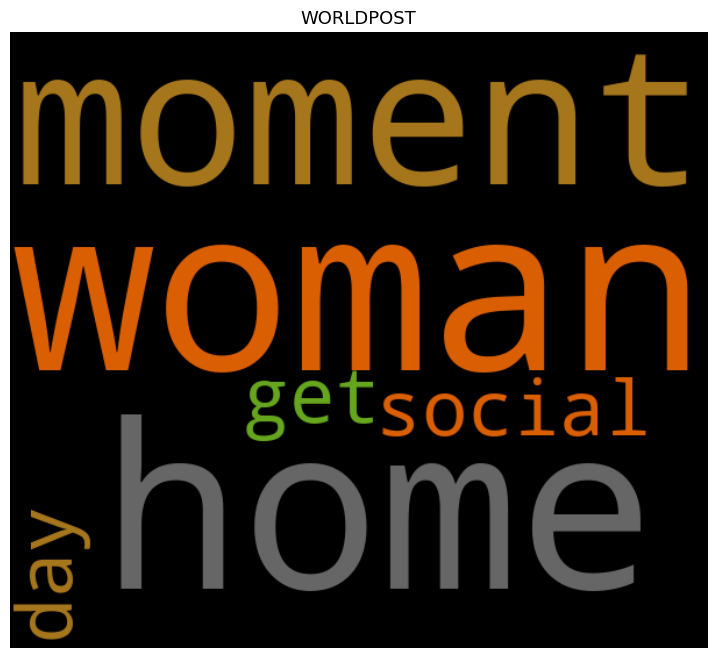

In [ ]:
import matplotlib.pyplot as plt
from textwrap import wrap


for index,headline in enumerate(text_dtm.columns):
    wordcloud(text_dtm[headline].sort_values(ascending=False),headline)

* **Article Category vs Author**

In [ ]:
def wordcloud(data,title):
    wc1 = WordCloud(width=600, height=530, max_words=150,colormap="Dark2").generate_from_frequencies(data)
    plt.figure(figsize=(10,8))
    plt.imshow(wc1, interpolation='bilinear')
    plt.axis("off")
    plt.title('\n'.join(wrap(title,60)),fontsize=13)
    plt.show()


In [ ]:
text_dtm1=text_dtm1.transpose()

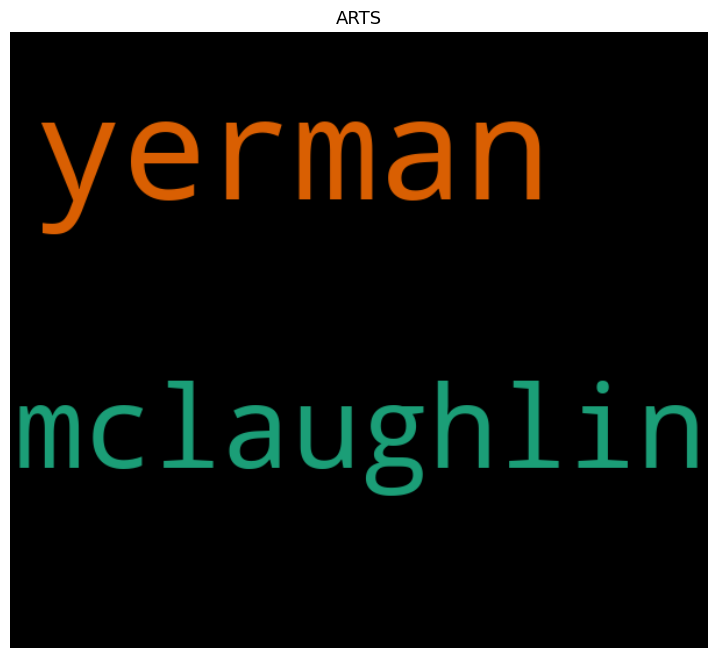

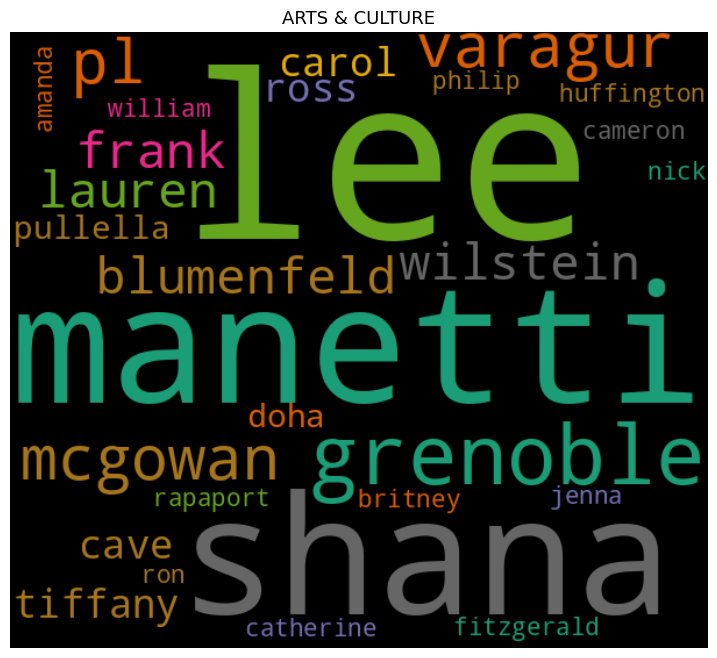

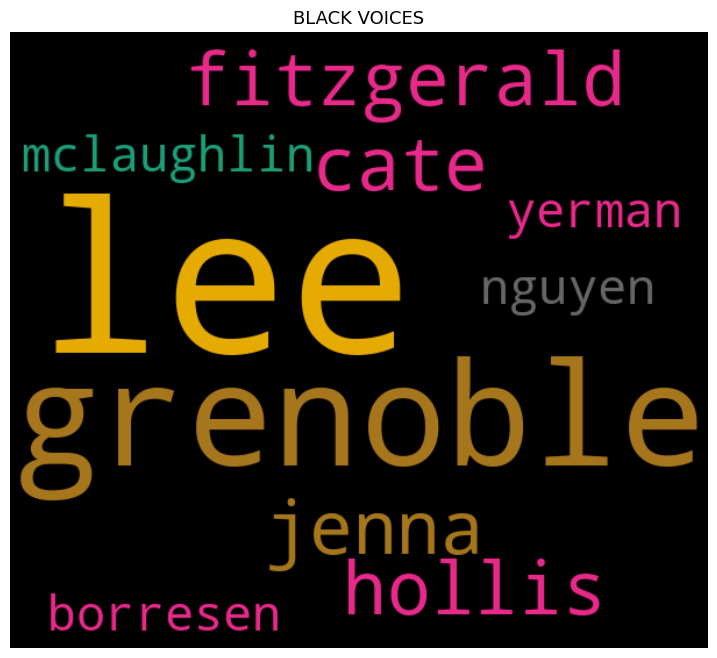

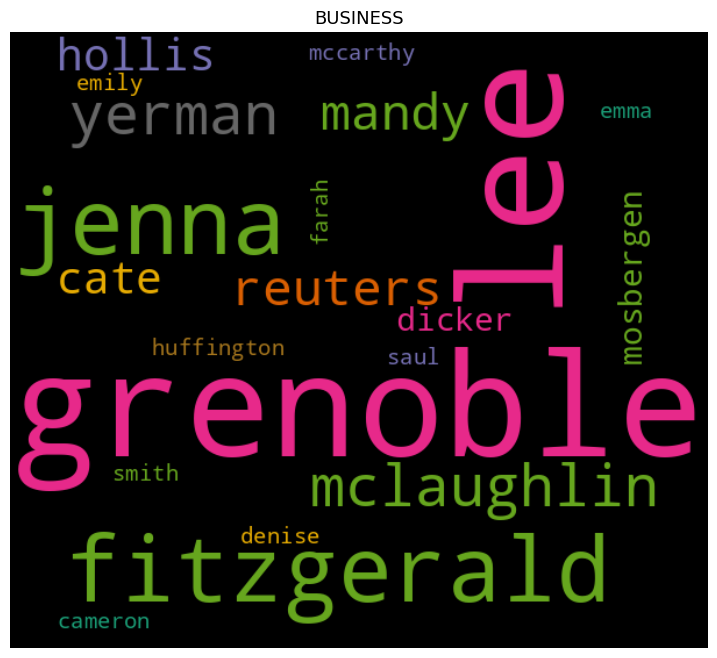

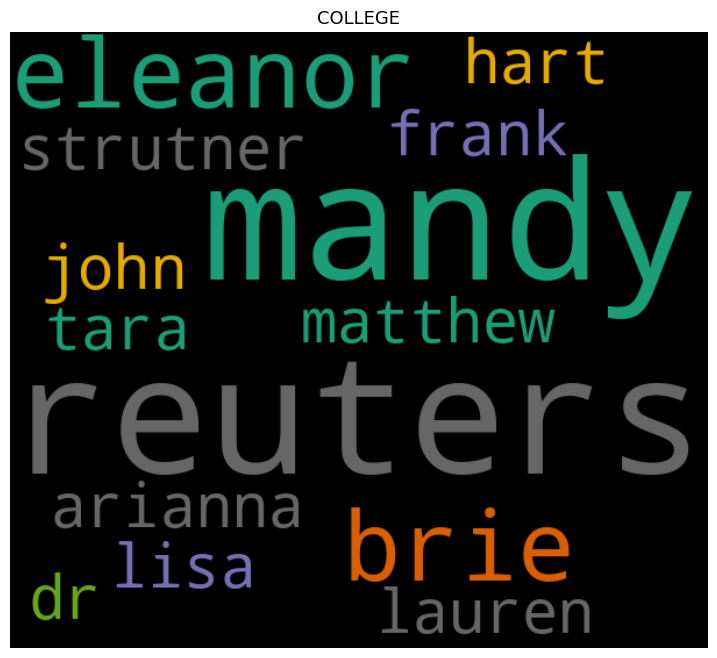

...

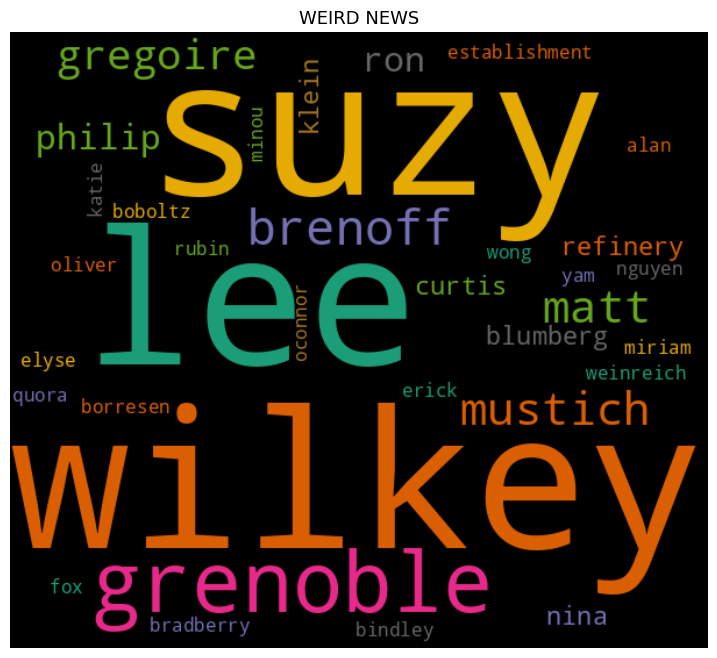

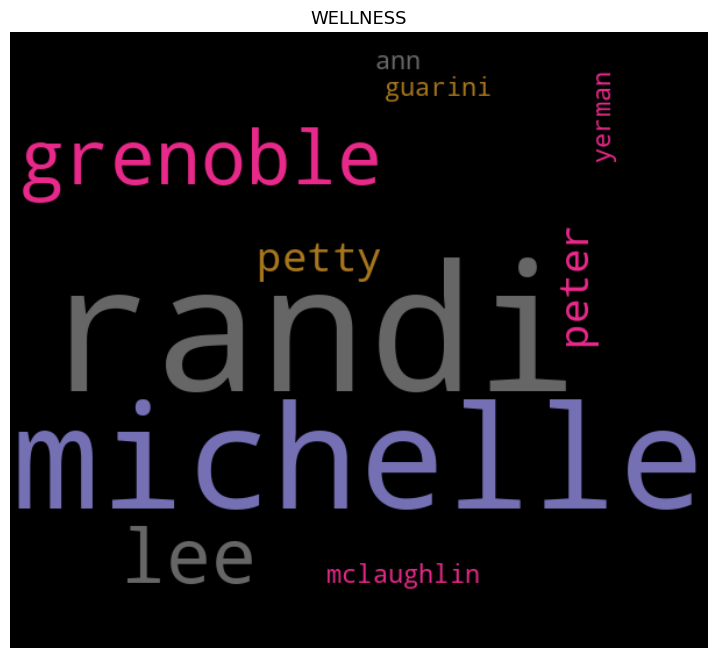

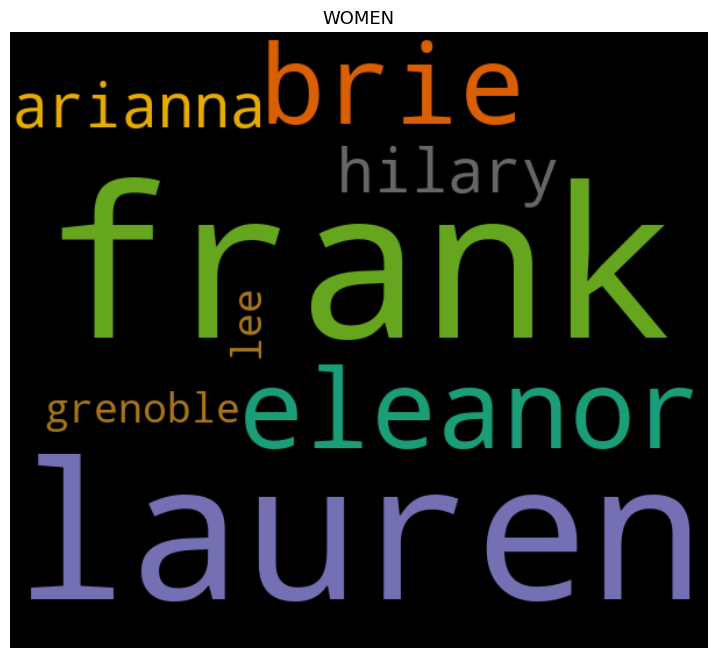

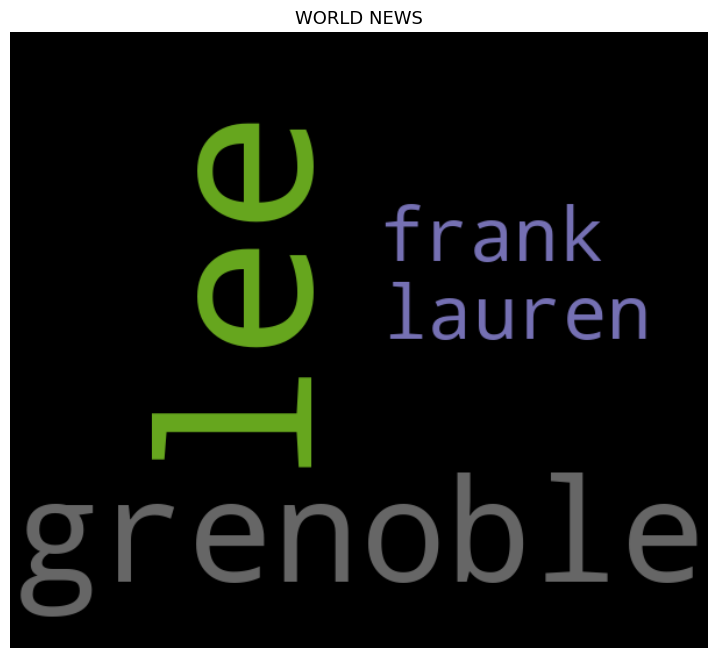

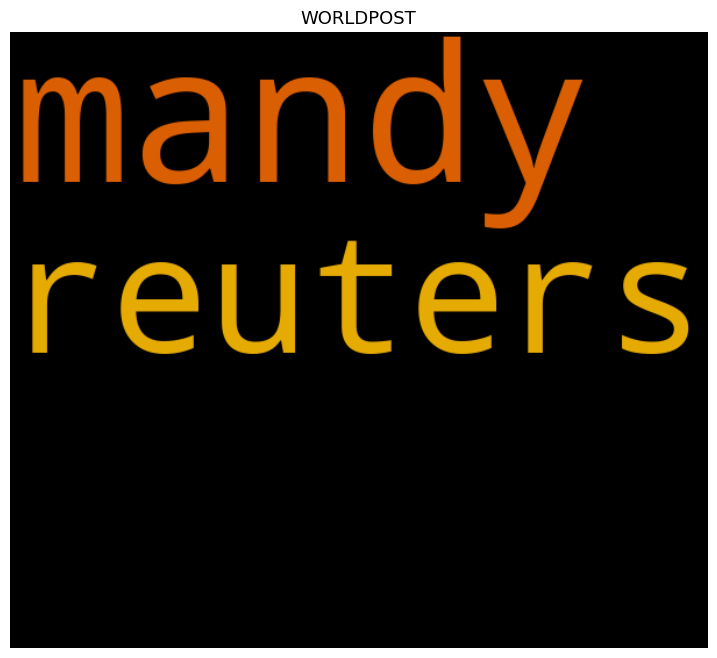

In [ ]:
import matplotlib.pyplot as plt
from textwrap import wrap


for index,headline in enumerate(text_dtm1.columns):
    wordcloud(text_dtm1[headline].sort_values(ascending=False),headline)

### Distplot

* Plot each article's News Headline's length

In [ ]:
df1['News_length']= df1['News Headline'].str.len()   #this gives length of each news article
df1['News_length']=df1['News_length'].astype(int)
df1

,Article category,News Headline,Author,News_length
0,WEDDINGS,real wed couple get marry weekend,arianna huffington,33
1,WELLNESS,moment know,meimei fox,11
2,POLITICS,sunday roundup,arianna huffington,14
3,PARENTS,funny parent tweet mom dad say twitter week,hollis miller,43
4,BUSINESS,watch second social medium,shawn amos,26
...,...,...,...,...
9082,ENTERTAINMENT,real wed couple get marry weekend photo,arianna huffington,39
9083,FOOD & DRINK,parenthesis best mom dad blog week,emma mustich,34
9084,THE WORLDPOST,sunday roundup,arianna huffington,14
9085,TECH,watch top youtube video week,arianna huffington,28


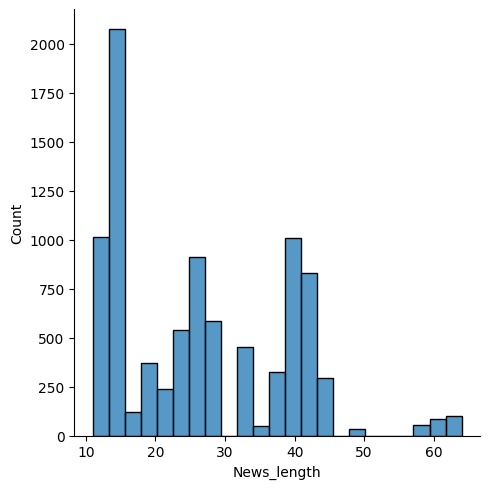

In [ ]:
sns.displot(df1['News_length'])

* Around 2000 articles have article length within around 13-16 words

(-0.5, 1599.5, 599.5, -0.5)

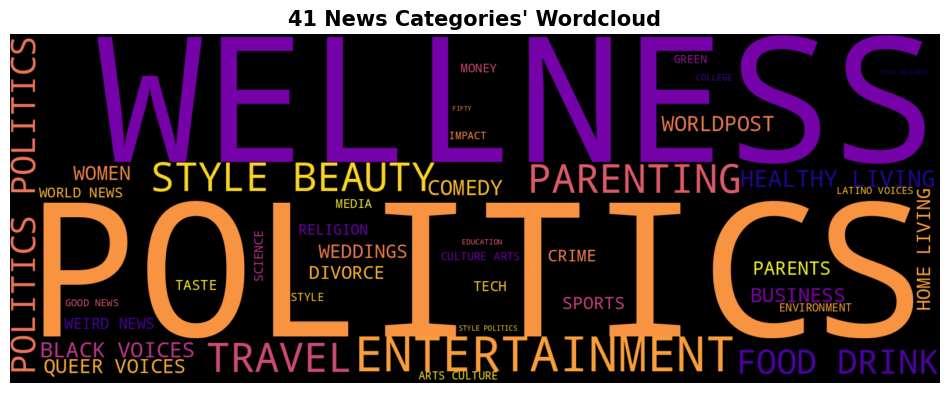

In [ ]:
# wordcloud of categories of news articles in our dataset
plt.figure(figsize=(12,12))
wc = WordCloud(max_words=1000,
               min_font_size=10,
               height=600,
               width=1600,
               background_color='black',
               contour_color='black',
               colormap='plasma',
               repeat=False,
               ).generate(' '.join(df1['Article category']))

plt.title("41 News Categories' Wordcloud", size=15, weight='bold')
plt.imshow(wc, interpolation= "bilinear")
plt.axis('off')

WordCloud - https://youtu.be/kdAhgwKehhA

## Deep Learning Model Building

* **Word Embeddings**
Word Embeddings are a method of extracting features out of text so that we can input those features into a machine learning model to work with text data.

- To reduce dimensionality

- To use a word to predict the words around it

- Inter word semantics must be captured


kaggle link - https://www.kaggle.com/code/gcdatkin/news-category-prediction-word-embeddings


https://www.kaggle.com/code/jannesklaas/17-nlp-and-word-embeddings


https://www.kaggle.com/code/yashvi/word-embeddings



https://www.kaggle.com/code/avikumart/nlp-news-articles-classif-wordembeddings-rnn - IMP FOR EDA

In [ ]:
map = dict(enumerate(df1['Article category'].unique()))
label_map = {value: key for key, value in map.items()}
label_map

{'WEDDINGS': 0,
 'WELLNESS': 1,
 'POLITICS': 2,
 'PARENTS': 3,
 'BUSINESS': 4,
 'FOOD & DRINK': 5,
 'TRAVEL': 6,
 'COMEDY': 7,
 'HOME & LIVING': 8,
 'BLACK VOICES': 9,
 'PARENTING': 10,
 'ENVIRONMENT': 11,
 'QUEER VOICES': 12,
 'WEIRD NEWS': 13,
 'HEALTHY LIVING': 14,
 'ENTERTAINMENT': 15,
 'CRIME': 16,
 'COLLEGE': 17,
 'SPORTS': 18,
 'MEDIA': 19,
 'IMPACT': 20,
 'THE WORLDPOST': 21,
 'WOMEN': 22,
 'ARTS & CULTURE': 23,
 'STYLE & BEAUTY': 24,
 'STYLE': 25,
 'CULTURE & ARTS': 26,
 'WORLDPOST': 27,
 'DIVORCE': 28,
 'RELIGION': 29,
 'MONEY': 30,
 'SCIENCE': 31,
 'GREEN': 32,
 'TASTE': 33,
 'WORLD NEWS': 34,
 'GOOD NEWS': 35,
 'TECH': 36,
 'LATINO VOICES': 37,
 'EDUCATION': 38,
 'FIFTY': 39,
 'ARTS': 40}

In [ ]:
num_class = len(label_map)
print('number of class:', num_class)

number of class: 41


One-hot encoding and word-indexing example on chunk of data

https://www.kaggle.com/code/avikumart/nlp-news-articles-classif-wordembeddings-rnn

In [ ]:
ndf = df1.copy()
ndf.head(2)


,Article category,News Headline,Author,News_length
0,WEDDINGS,real wed couple get marry weekend,arianna huffington,33
1,WELLNESS,moment know,meimei fox,11


In [ ]:
ndf.drop('News_length', inplace=True, axis=1)
#print(ndf)
# list of top 10  categories in out dataset


In [ ]:
# list of top 10  categories in out dataset
categories = ndf['Article category'][:10].to_list()
categories

['WEDDINGS',
 'WELLNESS',
 'POLITICS',
 'PARENTS',
 'BUSINESS',
 'POLITICS',
 'FOOD & DRINK',
 'TRAVEL',
 'COMEDY',
 'HOME & LIVING']

In [ ]:
articles_list = []

for i in categories:

    ndf2 = ndf[ndf['Article category'] == i]

    cat_array = ndf2['News Headline'].values  # array of news articles text in each category
    articles_list.append(cat_array)
#articles_list

In [ ]:
print("Text sentence before pre-processing:\n",ndf['News Headline'][0])
print("---"*35)

Text sentence before pre-processing:
 real wed couple get marry weekend
---------------------------------------------------------------------------------------------------------


In [ ]:
# length of total characters text data

news_length = ndf['News Headline'].apply(len).sum()
print(f"New characters length of text data: {news_length}")

New characters length of text data: 241008


In [ ]:
news_text = ndf['News Headline'].apply(lambda x: len([i for i in x.split()])).sum()
print(f"New word length of text data: {news_text}")

New word length of text data: 40222


In [ ]:
ndf2 = ndf.copy()

In [ ]:
ndf2.columns = ['category','headline','author']
ndf2.head(2)

,category,headline,author
0,WEDDINGS,real wed couple get marry weekend,arianna huffington
1,WELLNESS,moment know,meimei fox


* Analytics vidya - https://www.analyticsvidhya.com/blog/2022/09/understanding-word-embeddings-and-building-your-first-rnn-model/

https://www.kaggle.com/code/gcdatkin/news-category-prediction-word-embeddings